# Basic Example

-------------------

In this example, we are going to cover the basic workflow 
to turn a DEM into a full mesh.

The basic workflow follows this pattern:

* Import the DEM
* Perform watershed delineation
* Verify that feature looks accurate
* Construct the surface mesh
* Construct the layered mesh
* Define facesets
* Save the mesh


In [1]:
import tinerator as tin
print(tin.VERSION)

v0.3.1


In [2]:
%matplotlib inline
from pyvista import set_plot_theme
from pyvista import examples
set_plot_theme('document')

import pyvista as pv


In [4]:
ls /home/jovyan/work/

 anaconda3/               Downloads/   Music/      slf4j.simpleLogger.log
 Applications/            Dropbox/     Paraview/   Zotero/
'Creative Cloud Files'/   HDF5/        Pictures/
 Desktop/                 Library/     Public/
 Documents/               Movies/      SCons/


## Importing the DEM

Methods of import are found in the submodule `tinerator.load`. Some of these are:

* `from_file`: load from a locally-stored file
* `from_matrix`: initialize from a Numpy matrix
* `from_coordinates`: download and initialize from a longitude / latitude bounding box
* `from_shapefile`: download and initialize from a shapefile

After reading or downloading a DEM, an object of type `tinerator.DEM` is returned. This class contains all information related to tinning a particular GIS object: GIS data, such as the DEM matrix and shapefile polygons, meshing data, spatial data, and more. Further information on this class can be found by reading the [API Documentation](../api/index.md).

The DEM - and associated metadata - is stored in the `tinerator.DEM.dem` attribute, which itself is a [`richdem.rdarray`](https://richdem.readthedocs.io/en/latest/python_api.html#richdem.rdarray) object:

```python
>>> print(my_dem.dem.__dict__)
{
  'metadata': {
    'PROCESSING_HISTORY':
       '\n2019-01-23 18:53:20.598492 UTC | RichDEM (Python 0.3.4) (hash="ee05922", hashdate="2018-07-13 13:01:09 -0700") | LoadGDAL(filename=data/dem.asc, no_data=-9999.0)'},
  'no_data': -9999.0,
  'projection': '',
  'geotransform': (0.0, 10.0, 0.0, 7510.0, 0.0, -10.0)
}
```

Upon load, this metadata is parsed into specific `tinerator.DEM` variables. It is unlikely an end-user will need access to this RichDEM metadata.

In [5]:
data_dir = '/home/jovyan/work/Dropbox/PNNL/People/Lee_Raymond/columbia_subbasin_DEM.asc'

In [6]:
my_dem = tin.load.from_file(data_dir)

[21:58:16 -            from_file()] INFO - Reading DEM: /home/jovyan/work/Dropbox/PNNL/People/Lee_Raymond/columbia_subbasin_DEM.asc


In [5]:
# print(my_dem.dem.__dict__)

{'metadata': {'PROCESSING_HISTORY': '\n2019-06-26 23:47:48.439111 UTC | RichDEM (Python 0.3.4) (hash="ee05922", hashdate="2018-07-13 13:01:09 -0700") | LoadGDAL(filename=./data/DEM/USGS-hanford-30m-mosaic.asc, no_data=-9999.0)'}, 'no_data': -9999.0, 'projection': 'PROJCS["NAD83_HARN_Washington_South",GEOGCS["GCS_NAD83(HARN)",DATUM["NAD83_High_Accuracy_Reference_Network",SPHEROID["GRS_1980",6378137,298.257222101]],PRIMEM["Greenwich",0],UNIT["Degree",0.017453292519943295]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["standard_parallel_1",47.33333333333334],PARAMETER["standard_parallel_2",45.83333333333334],PARAMETER["latitude_of_origin",45.33333333333334],PARAMETER["central_meridian",-120.5],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["Meter",1]]', 'geotransform': (530379.5598, 30.0, 0.0, 297342.677099999, 0.0, -30.0)}


In [10]:
print("NODATAVALUE: {0}\nLower-left Corner: ({1},{2})\nCell Size: {3}"
  .format(
      my_dem.no_data_value,
      my_dem.xll_corner,
      my_dem.yll_corner,
      my_dem.cell_size,
  )
)

NODATAVALUE: -9999.0
Lower-left Corner: (542829.5598,101052.67709999898)
Cell Size: 30.0


### view the DEM

[21:58:26 -             plot_dem()] INFO - Plotting DEM


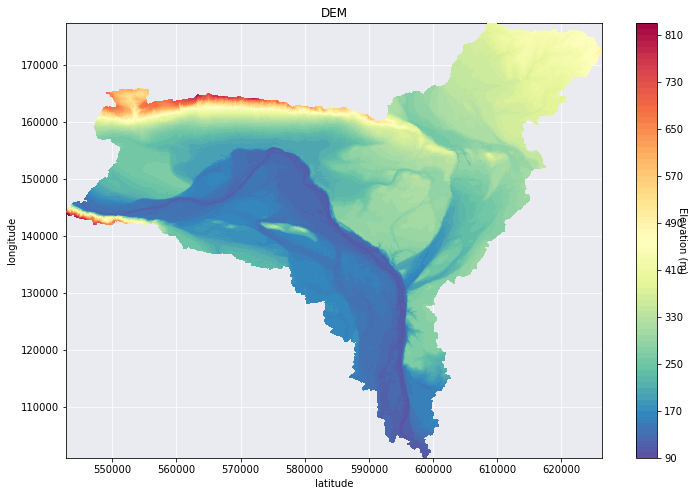

In [8]:
# View the DEM
tin.plot.plot_dem(my_dem) # alternately, you can call `my_dem.plot_dem()`

## Performing Watershed Delineation

In order to construct a dynamically refined TIN, watershed delineation is performed to capture a river feature for selective refinement around.

This is done with the method

    my_dem.watershed_delineation(threshold:float,method:str='D8')
    
It is difficult to initially tell what the threshold value should be.

Before performing delineation, then, we can preview what feature would be generated:

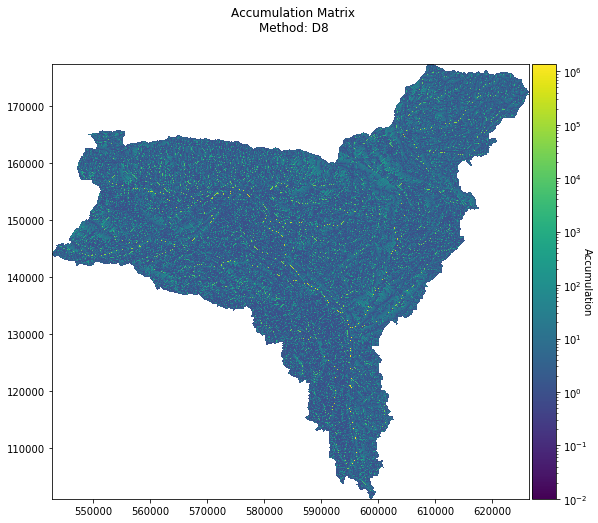

In [11]:
_ = tin.plot.preview_accumulation(my_dem)

Note that the feature appears around `1e4`. This will be our threshold value.

In [12]:
# Note - the threhold value `None` can *only* be used
# in `interactive` mode!
my_dem.watershed_delineation(None,interactive=True)

interactive(children=(FloatSlider(value=1.0, description='threshold', max=1376497.0, min=-1.0, step=13764.98),…

# Construct the Surface Mesh

Now that we are satisfied with the river feature, we can build the surface mesh.

* `DEM.build_refined_triplane(min_edge,max_edge)` - builds a surface mesh refined around a feature captured by watershed delineation, with triangle edge lengths between `min_edge` and `max_edge` size
* `DEM.build_uniform_triplane(edge_length)` - builds a surface mesh with uniform triangles, of edge length `edge_length`

In [13]:
# Again, None can only be used in interactive mode
my_dem.build_refined_triplane(None,None,interactive=True)

interactive(children=(FloatRangeSlider(value=(0.0, 1671.0), continuous_update=False, description='Edge Lengths…

## Visualizing the Surface Mesh

We can then visualize the mesh, with full 3D interactivity, using `vtki` (press `w` to switch to wireframe mode):

In [ ]:
outfile = 'surface_mesh.exo'
tin.dump.to_exodus(my_dem,outfile,mesh='surface')

In [5]:
surface_mesh = pv.read(outfile)

In [6]:
surface_mesh

MultiBlock (0x7f5498c80a68)
  N Blocks:	8
  X Bounds:	543654.562, 626334.562
  Y Bounds:	101067.680, 177057.672
  Z Bounds:	90.146, 793.049

In [7]:
surface_mesh.plot()

VTK(vtkXOpenGLRenderWindow, height=400, sizing_mode='stretch_width')

# Creating a Layered Mesh

We can then move to creating a stacked (layered) mesh.

The syntax is:

```python
DEM.build_layered_mesh(layers,matids:list=None)
```

Creating a stacked mesh requires only one argument: a list of depths to extrude. The number of layers created will be equal to the number of elements in the list.

For example, let's say that we want four layers: the first layer should be 10 meters thick, the second 20 meters, the third 30 meters, and the fourth 40 meters.

This would be represented as:

```python
depths = [10.,20.,30.,40.]
```

We can also assign material ID values to the layers, using another list of equal length.

```python
mat_ids = [1,4,2,1]
```

Note that material IDs must be integer-based.

In [9]:
depths = [10.,20.,30.,40.]
mat_ids = [1,4,2,1]

my_dem.build_layered_mesh(depths,matids=mat_ids)

[06:00:59 -        _stacked_mesh()] INFO - Stacking 4 layers
[06:00:59 -        _stacked_mesh()] INFO - Adding layer 1 with thickness 0.0
[06:01:00 -        _stacked_mesh()] INFO - Adding layer 2 with thickness 10.0
[06:01:00 -        _stacked_mesh()] INFO - Adding layer 3 with thickness 20.0
[06:01:01 -        _stacked_mesh()] INFO - Adding layer 4 with thickness 30.0
[06:01:01 -        _stacked_mesh()] INFO - Adding layer 5 with thickness 40.0
[06:01:01 -        _stacked_mesh()] INFO - Adding volume to layers


mo3

### Visualizing

In a similar fashion to the surface mesh, we can visualize the layered mesh as:

In [10]:
import pyvista

outfile = 'stacked_mesh.exo'
tin.dump.to_exodus(my_dem,outfile,mesh='stacked')
pyvista.read(outfile).plot()

[06:01:17 -            to_exodus()] INFO - Wrote Exodus mesh to: "stacked_mesh.exo"


VTK(vtkXOpenGLRenderWindow, height=400, sizing_mode='stretch_width')

# Facesets

TINerator has multiple methods for faceset generation, found in the `tinerator.facesets` submodule.

These are:

* `tinerator.facesets.basic`: can create top surface, bottom surface, and/or side surface facesets
* `tinerator.facesets.from_elevations`: creates top-surface facesets, discretized by elevation values
* `tinerator.facesets.sidesets`: creates side-surface facesets, discretized by clockwise [x,y] values

These faceset objects can be combined to create more complex facesets. 

In this example, however, we will only focus on basic facesets.

In [11]:
fs_basic = tin.facesets.basic(has_top=True,has_bottom=True,has_sides=True)

tin.dump.to_exodus(my_dem,'final_mesh.exo',facesets=fs_basic)

[06:02:08 -       write_facesets()] INFO - Preparing sidesets...
[06:02:13 -       __driver_naive()] INFO - Generating top faceset
[06:02:14 -       __driver_naive()] INFO - Generating bottom faceset
[06:02:14 -       __driver_naive()] INFO - Generating sides faceset
[06:02:15 -            to_exodus()] INFO - Wrote Exodus mesh (of type: prism, with facesets: 3) to: "final_mesh.exo"


### Visualizing

We can visualize the sidesets only through:

In [12]:
import pyvista

pyvista.read('final_mesh.exo')['Side Sets'].plot()

VTK(vtkXOpenGLRenderWindow, height=400, sizing_mode='stretch_width')

# Conclusion

This has been a basic workflow for TINerator. More advanced capabilities can be found in other Jupyter notebooks in this directory, or through the API on the [TINerator homepage](https://raw.githack.com/lanl/LaGriT/tinerator/html/index.html).